In [126]:
import numpy as np
import pandas as pd
# import numpy & pandas

# pip install jedi
# # for auto completion
# pd.options.display.max_columns=500
# pd.options.display.max_rows=200
# to set dataframes to show more cols & rows

import statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.multicomp
# import statsmodels for statistical modelling
from statsmodels.stats.outliers_influence import variance_inflation_factor
# importing VIF

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
# import scikit-learn for machine learning

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import pylab
from pylab import plot, show
from pylab import legend, title, xlabel, ylabel
# importing matplotlib & seaborn for plotting graphs
import os


from statsmodels.stats.multicomp import pairwise_tukeyhsd

from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

pd.set_option('display.max_columns', 100) # This will display maximum 100 columns
pd.set_option('display.max_rows', 100)

# Tasks:
1. Data Understanding and Preprocessing:

In [2]:
df = pd.read_csv("data.csv")

In [3]:
df.shape

(6819, 96)

In [4]:
#df.columns

In [5]:
print("No Of  Rows   : ",df.shape[0])
print("No Of Columns : ",df.shape[1])

No Of  Rows   :  6819
No Of Columns :  96


In [6]:
df.head()   ## TOp 5 Rows

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256969e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897851e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.0068

In [7]:
df.tail()    ### Last 5 Rows

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,0.781588,1.510213e-04,4.500000e+09,0.463734,1.790179e-04,0.113372,0.175045,0.175045,0.175045,0.216602,0.320966,0.020766,0.098200,0.172102,0.022374,0.848205,0.689778,0.689778,0.217635,7.070000e+09,0.000450,0.264517,0.380155,0.010451,0.005457,0.631415,0.006655,0.124618,0.875382,0.005150,0.373823,0.005366,0.098222,0.171111,0.404804,0.103448,0.000690,0.009177,4.030000e+07,0.000143,0.027903,0.006348,0.392596,0.006312,0.817769,0.312840,0.578455,0.099481,0.005469,0.005072,0.103838,0.346224,0.277543,0.013212,0.786888,0.736716,0.330914,1.792237e-03,0.925611,0.002266,0.019060,0.000229,0.000124,0.593985,1.077940e-04,0.671570,0.400338,0.786888,0.330914,0.112622,0.639806,0.458639,0.587178,0.314063,0.027951,0,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,0.781586,5.220000e+09,1.440000e+09,0.461978,2.370237e-04,0.371596,0.181324,0.181324,0.181324,0.216697,0.318278,0.023050,0.098608,0.172780,0.022159,0.848245,0.689734,0.689734,0.217631,5.220000e+09,0.000445,0.264730,0.377389,0.009259,0.006741,0.631489,0.004623,0.099253,0.900747,0.006772,0.372505,0.008619,0.098572,0.171805,0.399926,0.103448,0.000655,0.009652,9.940000e+0

In [8]:
df.dtypes    ## Checking The Data Type OF Columns

Bankrupt?                                                     int64
 ROA(C) before interest and depreciation before interest    float64
 ROA(A) before interest and % after tax                     float64
 ROA(B) before interest and depreciation after tax          float64
 Operating Gross Margin                                     float64
 Realized Sales Gross Margin                                float64
 Operating Profit Rate                                      float64
 Pre-tax net Interest Rate                                  float64
 After-tax net Interest Rate                                float64
 Non-industry income and expenditure/revenue                float64
 Continuous interest rate (after tax)                       float64
 Operating Expense Rate                                     float64
 Research and development expense rate                      float64
 Cash flow rate                                             float64
 Interest-bearing debt interest rate            

In [9]:
df.info()     ## Checking The not-null values and data Types

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

#  Check The Duplicate Records

In [10]:
df_duplicate_Rows = df[df.duplicated()]
df_duplicate_Rows.shape         ## There is No Duplicate Record

print("Duplicated Record Present : ",df.duplicated().sum())

Duplicated Record Present :  0


# ---Handle Missing Values------

In [11]:
## Checking Null Values

df.isnull().sum()          ## There is No Null Value

Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
 Realized Sales Gross Margin                                0
 Operating Profit Rate                                      0
 Pre-tax net Interest Rate                                  0
 After-tax net Interest Rate                                0
 Non-industry income and expenditure/revenue                0
 Continuous interest rate (after tax)                       0
 Operating Expense Rate                                     0
 Research and development expense rate                      0
 Cash flow rate                                             0
 Interest-bearing debt interest rate                        0
 Tax rate (A)                                               0
 Net Val

In [12]:
## There Are No Duplicate Records And There is No Null Values

In [13]:
#df["ROA(C)beforeinterestanddepreciationbeforeinterest"].sum()
#3448.1459805976697

# ----Detecting and handeling outliers.--------

In [14]:
df.columns = df.columns.str.replace(' ', '')
# Removing the sapce between the name of columns.

df.columns = df.columns.str.replace('/', '_')
df.columns = df.columns.str.replace('-', '_')

df.columns = df.columns.str.replace('%', '_per')
df.columns = df.columns.str.replace('?', '')

C:\Users\Gaurav\AppData\Local\Temp\ipykernel_16096\3727070641.py:8: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df.columns = df.columns.str.replace('?', '')


In [15]:
df.head(2)

,Bankrupt,ROA(C)beforeinterestanddepreciationbeforeinterest,ROA(A)beforeinterestand_peraftertax,ROA(B)beforeinterestanddepreciationaftertax,OperatingGrossMargin,RealizedSalesGrossMargin,OperatingProfitRate,Pre_taxnetInterestRate,After_taxnetInterestRate,Non_industryincomeandexpenditure_revenue,Continuousinterestrate(aftertax),OperatingExpenseRate,Researchanddevelopmentexpenserate,Cashflowrate,Interest_bearingdebtinterestrate,Taxrate(A),NetValuePerShare(B),NetValuePerShare(A),NetValuePerShare(C),PersistentEPSintheLastFourSeasons,CashFlowPerShare,RevenuePerShare(Yuan¥),OperatingProfitPerShare(Yuan¥),PerShareNetprofitbeforetax(Yuan¥),RealizedSalesGrossProfitGrowthRate,OperatingProfitGrowthRate,After_taxNetProfitGrowthRate,RegularNetProfitGrowthRate,ContinuousNetProfitGrowthRate,TotalAssetGrowthRate,NetValueGrowthRate,TotalAssetReturnGrowthRateRatio,CashReinvestment_per,CurrentRatio,QuickRatio,InterestExpenseRatio,Totaldebt_Totalnetworth,Debtratio_per,Networth_Assets,Long_termfundsuitabilityratio(A),Borrowingdependency,Contingentliabilities_Networth,Operatingprofit_Paid_incapital,Netprofitbeforetax_Paid_incapital,Inventoryandaccountsreceivable_Netvalue,TotalAssetTurnover,AccountsReceivableTurnover,AverageCollectionDays,InventoryTurnoverRate(times),FixedAssetsTurnoverFrequency,NetWorthTurnoverRate(times),Revenueperperson,Operatingprofitperperson,Allocationrateperperson,WorkingCapitaltoTotalAssets,QuickAssets_TotalAssets,CurrentAssets_TotalAssets,Cash_TotalAssets,QuickAssets_CurrentLiability,Cash_CurrentLiability,CurrentLiabilitytoAssets,OperatingFundstoLiability,Inventory_WorkingCapital,Inventory_CurrentLiability,CurrentLiabilities_Liability,WorkingCapital_Equity,CurrentLiabilities_Equity,Long_termLiabilitytoCurrentAssets,RetainedEarningstoTotalAssets,Totalincome_Totalexpense,Totalexpense_Assets,CurrentAssetTurnoverRate,QuickAssetTurnoverRate,WorkingcapitcalTurnoverRate,CashTurnoverRate,CashFlowtoSales,FixedAssetstoAssets,CurrentLiabilitytoLiability,CurrentLiabilitytoEquity,EquitytoLong_termLiability,CashFlowtoTotalAssets,CashFlowtoLiability,CFOtoAssets,CashFlowtoEquity,CurrentLiabilitytoCurrentAssets,Liability_AssetsFlag,NetIncometoTotalAssets,TotalassetstoGNPprice,No_creditInterval,GrossProfittoSales,NetIncometoStockholder'sEquity,LiabilitytoEquity,DegreeofFinancialLeverage(DFL),InterestCoverageRatio(InterestexpensetoEBIT),NetIncomeFlag,EquitytoLiability
0,1,0.370594,0.424389,0.40575,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,0.000126,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,0.000147,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.51673,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,0.000290,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.006889,0.391590,0.012335,0.751111,0.127236,0.182419,0.014948,0.004136,0.001384,0.056963,0.341106,0.289642,0.005210,0.308589,0.731975,0.329740,0.023947,0.931065,0.002226,0.025516,1.065198e-04,7.700000e+09,0.593916,2.490000e+09,0.671570,0.468828,0.308589,0.329740,0.120916,0.641100,0.459001,0.

In [16]:
## Here I create the Function To find The Inter-Quartile-Range And Lower-Bond & Upper Bond And To Impute Outliers

def impute_outlier(x):
    Q1 = df[x].quantile(0.25)
    Q3 = df[x].quantile(0.75)
    
    IQR = Q3 - Q1
    
    lb = Q1 - 1.5*(IQR)
    ub = Q3 + 1.5*(IQR)
    
    idx_ub = np.where(df[x]>ub)
    df[x].iloc[idx_ub] = ub
    idx_lb = np.where(df[x]<lb)
    df[x].iloc[idx_lb] = lb

In [17]:
# Compute correlations Before Removing Outliers
pre_correlations = df.corr()['Bankrupt'].sort_values(ascending=False)

# Display correlations for features
print(pre_correlations.head(11))

Bankrupt                           1.000000
Debtratio_per                      0.250161
CurrentLiabilitytoAssets           0.194494
Borrowingdependency                0.176543
CurrentLiabilitytoCurrentAssets    0.171306
LiabilitytoEquity                  0.166812
CurrentLiabilities_Equity          0.153828
CurrentLiabilitytoEquity           0.153828
Liability_AssetsFlag               0.139212
Totalexpense_Assets                0.139049
EquitytoLong_termLiability         0.139014
Name: Bankrupt, dtype: float64


In [18]:
df_Before = df[["Bankrupt","Borrowingdependency","Totaldebt_Totalnetworth","Debtratio_per",
                "LiabilitytoEquity","CurrentLiabilitytoCurrentAssets","CurrentLiabilitytoEquity","CurrentLiabilities_Equity",
               "CurrentLiabilitytoAssets","EquitytoLong_termLiability","Liability_AssetsFlag"]]

In [19]:
df_Before.head(2)

,Bankrupt,Borrowingdependency,Totaldebt_Totalnetworth,Debtratio_per,LiabilitytoEquity,CurrentLiabilitytoCurrentAssets,CurrentLiabilitytoEquity,CurrentLiabilities_Equity,CurrentLiabilitytoAssets,EquitytoLong_termLiability,Liability_AssetsFlag
0,1,0.390284,0.021266,0.207576,0.290202,0.118250,0.339077,0.339077,0.147308,0.126549,0
1,1,0.376760,0.012502,0.171176,0.283846,0.047775,0.329740,0.329740,0.056963,0.120916,0


# ---- Finding Outliers By Using Box Plot------

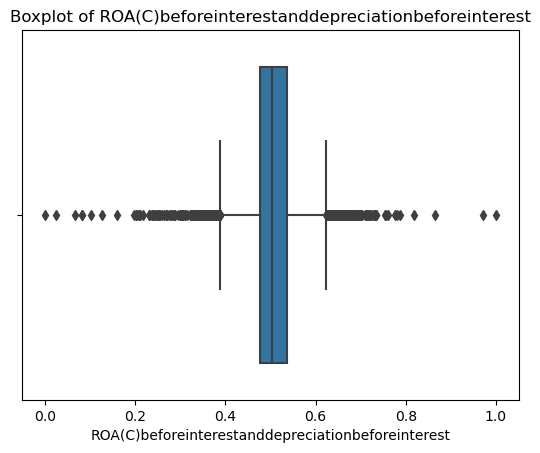

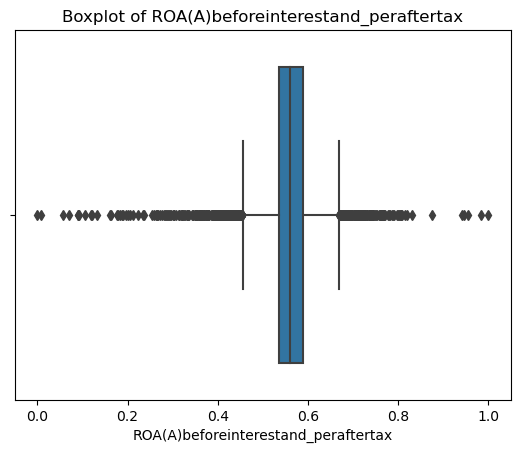

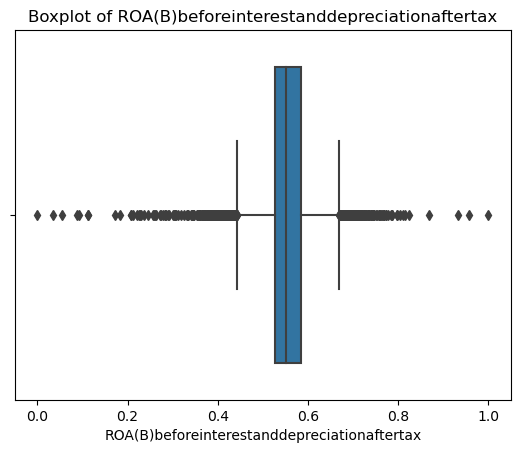

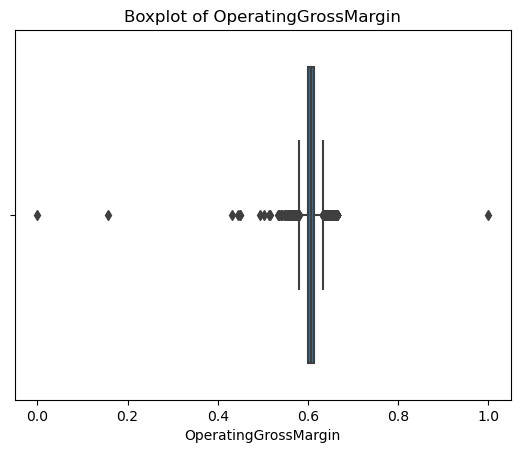

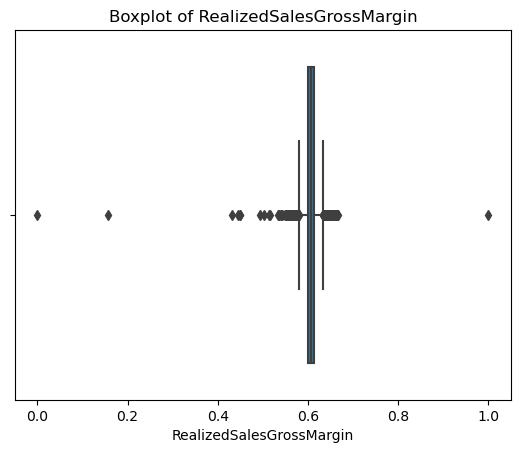

...

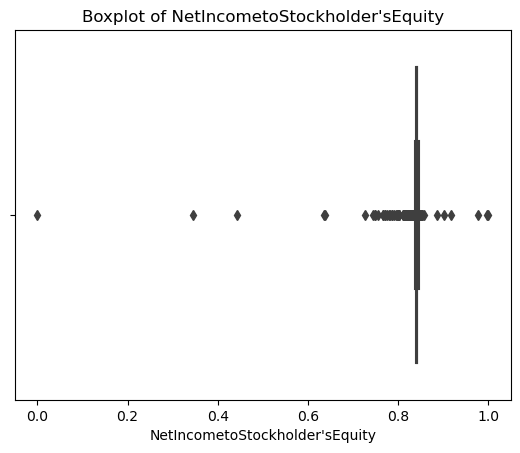

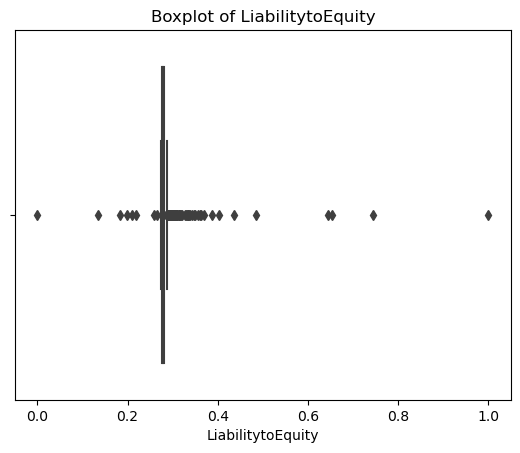

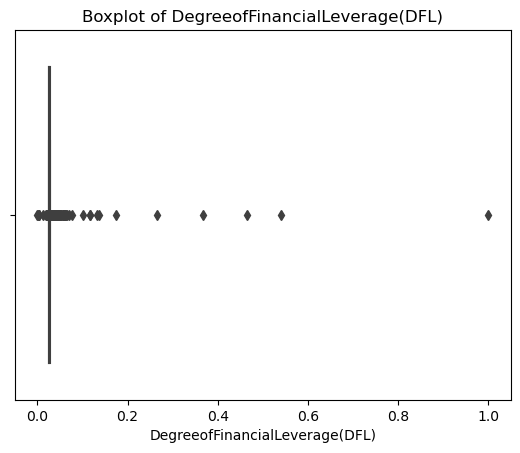

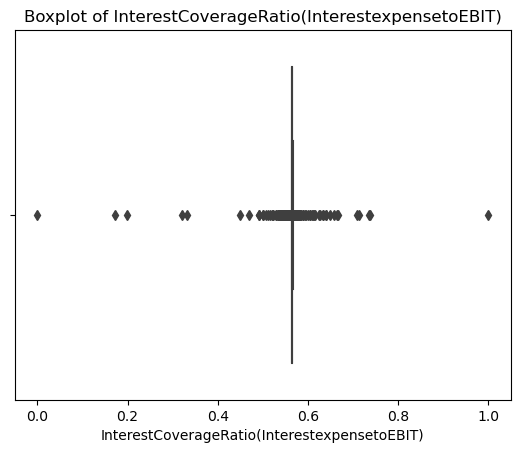

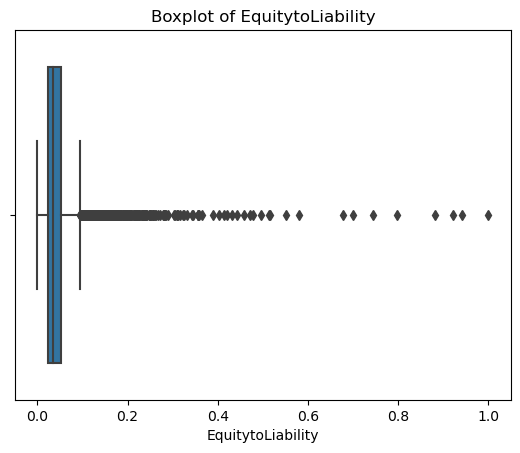

In [20]:
float_columns = df.select_dtypes(include=['float64', 'float32']).columns


plot_count = 0
for column in float_columns:
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.show()
    plot_count+=1

In [21]:
import numpy as np
import pandas as pd

# Function to detect outliers using IQR for float columns
def detect_outliers_iqr(df):
    outliers = {}
    for column in df.columns:
        if df[column].dtype == 'float64':  # Ensure the column is float
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            outliers[column] = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

print("================================================================================")

# Detect outliers in float columns
outliers = detect_outliers_iqr(df)

# Print the number of outliers for each float feature
count = 0
for feature, outlier_data in outliers.items():
    print(f'{feature}: {len(outlier_data)} outliers')
    if len(outlier_data) > 0:
        count += 1

print("=============================================================================================")

# Function to cap outliers for float columns using IQR
def cap_outliers(df):
    for column in df.columns:
        if df[column].dtype == 'float64':  # Ensure the column is float
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
            df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    return df

# Handle outliers in float columns
data_cleaned = cap_outliers(df)

# Verify the changes
print("==============================================================================")
print("Outliers have been capped.")
data_cleaned.describe()
print("=============================================================================")
print("Outliers Found In:", count, "columns")

ROA(C)beforeinterestanddepreciationbeforeinterest: 391 outliers
ROA(A)beforeinterestand_peraftertax: 561 outliers
ROA(B)beforeinterestanddepreciationaftertax: 432 outliers
OperatingGrossMargin: 320 outliers
RealizedSalesGrossMargin: 318 outliers
OperatingProfitRate: 716 outliers
Pre_taxnetInterestRate: 773 outliers
After_taxnetInterestRate: 867 outliers
Non_industryincomeandexpenditure_revenue: 1094 outliers
Continuousinterestrate(aftertax): 806 outliers
OperatingExpenseRate: 0 outliers
Researchanddevelopmentexpenserate: 182 outliers
Cashflowrate: 576 outliers
Interest_bearingdebtinterestrate: 396 outliers
Taxrate(A): 120 outliers
NetValuePerShare(B): 457 outliers
NetValuePerShare(A): 464 outliers
NetValuePerShare(C): 465 outliers
PersistentEPSintheLastFourSeasons: 508 outliers
CashFlowPerShare: 532 outliers
RevenuePerShare(Yuan¥): 478 outliers
OperatingProfitPerShare(Yuan¥): 442 outliers
PerShareNetprofitbeforetax(Yuan¥): 511 outliers
RealizedSalesGrossProfitGrowthRate: 814 outliers
O

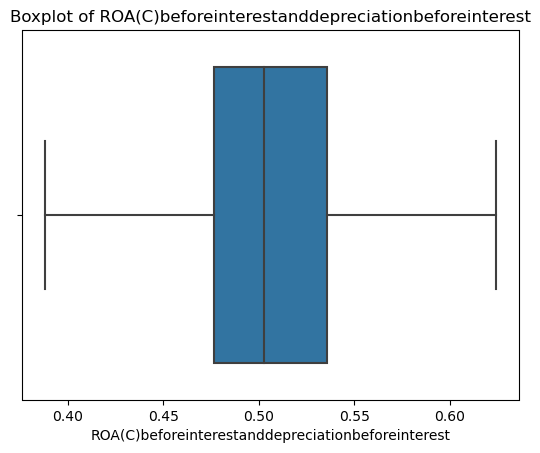

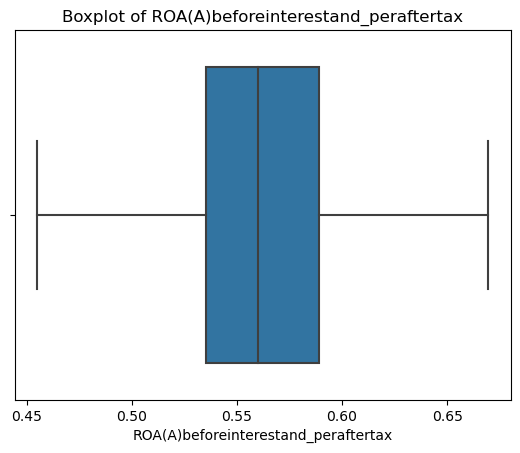

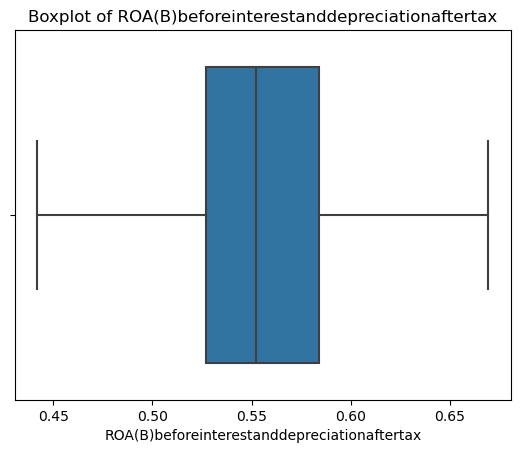

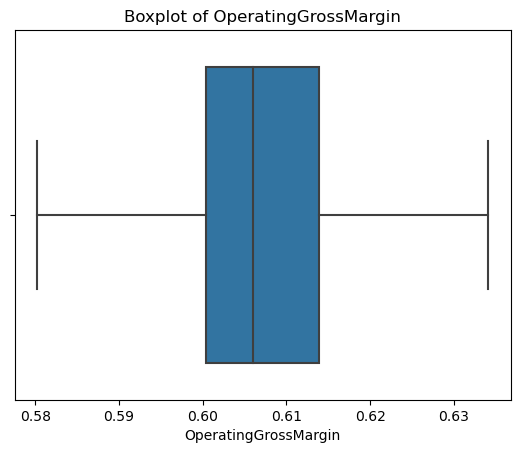

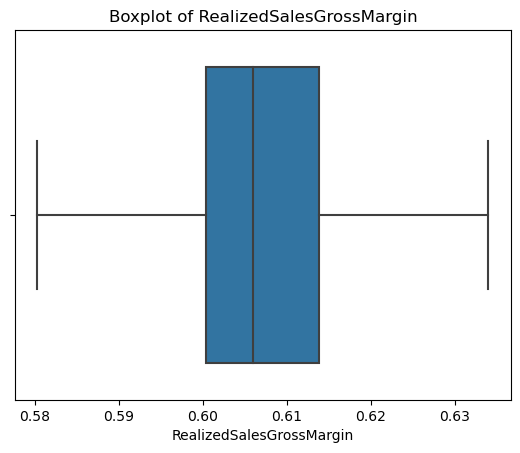

...

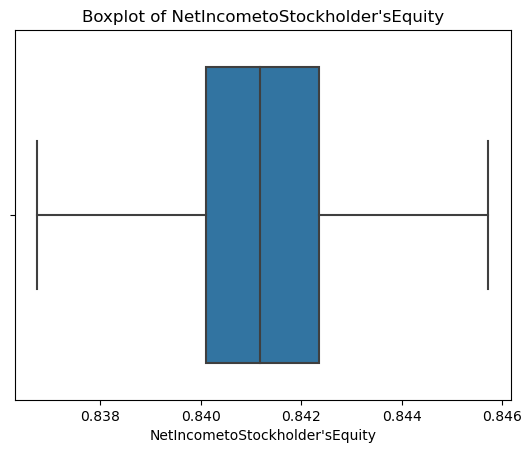

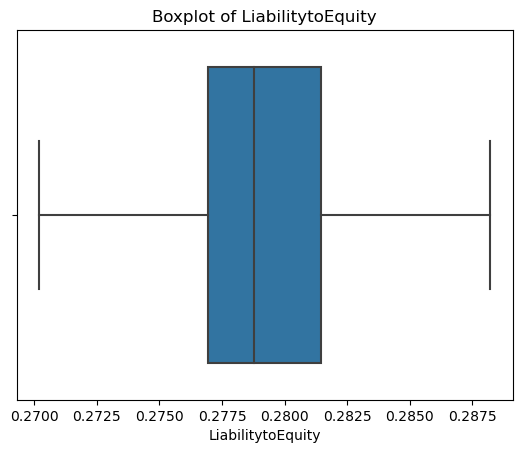

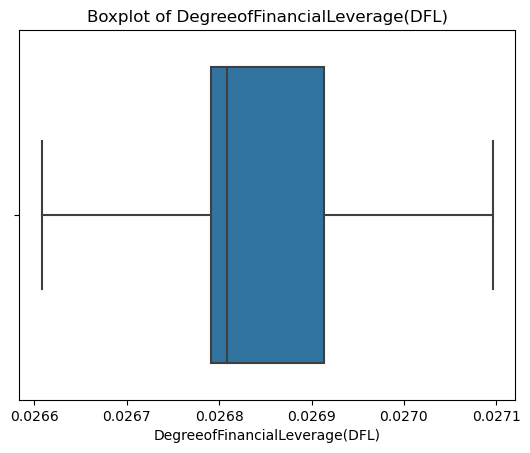

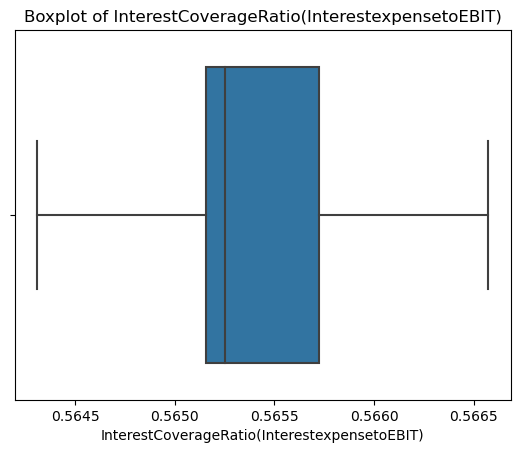

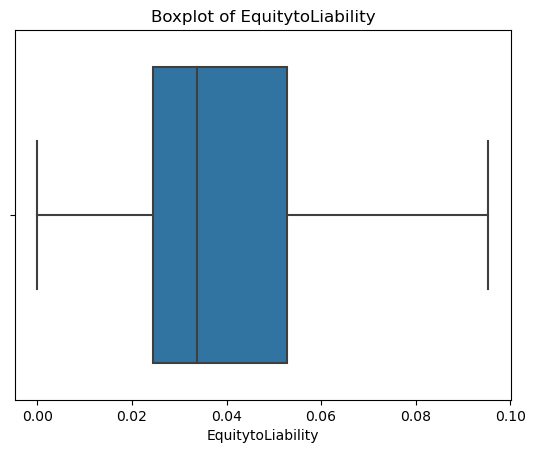

In [22]:
float_columns = df.select_dtypes(include=['float64', 'float32']).columns


plot_count = 0
for column in float_columns:
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.show()
    plot_count+=1

In [23]:
print(plot_count)

93


# ------Exploratory Data Analysis (EDA):--------

# 1. Generate descriptive statistics.

In [24]:
df.describe()

,Bankrupt,ROA(C)beforeinterestanddepreciationbeforeinterest,ROA(A)beforeinterestand_peraftertax,ROA(B)beforeinterestanddepreciationaftertax,OperatingGrossMargin,RealizedSalesGrossMargin,OperatingProfitRate,Pre_taxnetInterestRate,After_taxnetInterestRate,Non_industryincomeandexpenditure_revenue,Continuousinterestrate(aftertax),OperatingExpenseRate,Researchanddevelopmentexpenserate,Cashflowrate,Interest_bearingdebtinterestrate,Taxrate(A),NetValuePerShare(B),NetValuePerShare(A),NetValuePerShare(C),PersistentEPSintheLastFourSeasons,CashFlowPerShare,RevenuePerShare(Yuan¥),OperatingProfitPerShare(Yuan¥),PerShareNetprofitbeforetax(Yuan¥),RealizedSalesGrossProfitGrowthRate,OperatingProfitGrowthRate,After_taxNetProfitGrowthRate,RegularNetProfitGrowthRate,ContinuousNetProfitGrowthRate,TotalAssetGrowthRate,NetValueGrowthRate,TotalAssetReturnGrowthRateRatio,CashReinvestment_per,CurrentRatio,QuickRatio,InterestExpenseRatio,Totaldebt_Totalnetworth,Debtratio_per,Networth_Assets,Long_termfundsuitabilityratio(A),Borrowingdependency,Contingentliabilities_Networth,Operatingprofit_Paid_incapital,Netprofitbeforetax_Paid_incapital,Inventoryandaccountsreceivable_Netvalue,TotalAssetTurnover,AccountsReceivableTurnover,AverageCollectionDays,InventoryTurnoverRate(times),FixedAssetsTurnoverFrequency,NetWorthTurnoverRate(times),Revenueperperson,Operatingprofitperperson,Allocationrateperperson,WorkingCapitaltoTotalAssets,QuickAssets_TotalAssets,CurrentAssets_TotalAssets,Cash_TotalAssets,QuickAssets_CurrentLiability,Cash_CurrentLiability,CurrentLiabilitytoAssets,OperatingFundstoLiability,Inventory_WorkingCapital,Inventory_CurrentLiability,CurrentLiabilities_Liability,WorkingCapital_Equity,CurrentLiabilities_Equity,Long_termLiabilitytoCurrentAssets,RetainedEarningstoTotalAssets,Totalincome_Totalexpense,Totalexpense_Assets,CurrentAssetTurnoverRate,QuickAssetTurnoverRate,WorkingcapitcalTurnoverRate,CashTurnoverRate,CashFlowtoSales,FixedAssetstoAssets,CurrentLiabilitytoLiability,CurrentLiabilitytoEquity,EquitytoLong_termLiability,CashFlowtoTotalAssets,CashFlowtoLiability,CFOtoAssets,CashFlowtoEquity,CurrentLiabilitytoCurrentAssets,Liability_AssetsFlag,NetIncometoTotalAssets,TotalassetstoGNPprice,No_creditInterval,GrossProfittoSales,NetIncometoStockholder'sEquity,LiabilitytoEquity,DegreeofFinancialLeverage(DFL),InterestCoverageRatio(InterestexpensetoEBIT),NetIncomeFlag,EquitytoLiability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505667,0.560507,0.554691,0.607834,0.607812,0.999028,0.797467,0.809378,0.303526,0.781637,1.995347e+09,1.932209e+09,0.466665,0.000379,0.111545,0.188108,0.188098,0.188134,0.227074,0.323243,0.034366,0.107233,0.182461,0.022113,0.848055,0.689453,0.689453,0.217600,5.671397e+09,0.000474,0.264090,0.380314,0.012922,0.009309,0.630857,0.006830,0.112930,0.887070,0.006287,0.373946,0.005605,0.107116,0.181044,0.401688,0.135366,0.001171,0.00691

In [25]:
# Companies with higher profitability ratios like ROA (Return on Assets) and operating 
#profit tend to exhibit better financial stability  and are less likely to face bankruptcy.


## Count of "0" is greater than "1"

# --------Visualize feature distributions and target variable.------

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '1')])

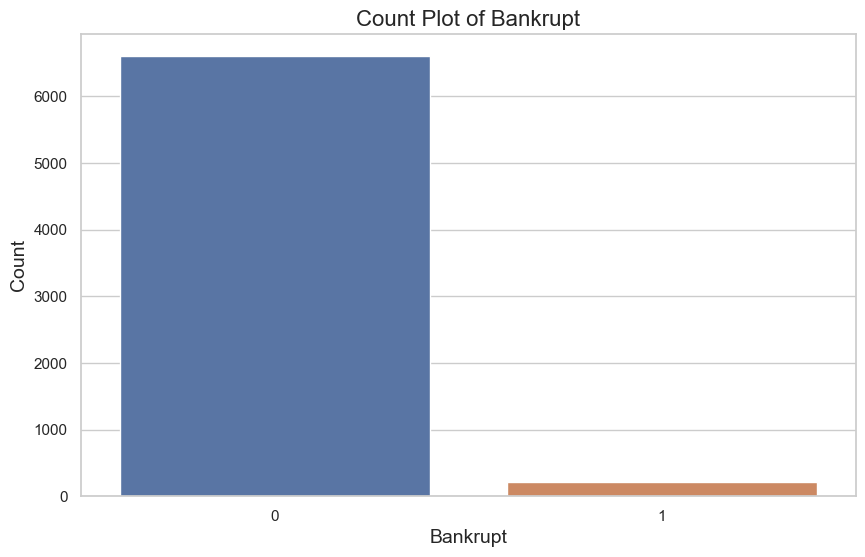

In [26]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6)) 
sns.countplot(x='Bankrupt', data=df)
plt.title('Count Plot of Bankrupt', fontsize=16) 
plt.xlabel('Bankrupt', fontsize=14)
plt.ylabel('Count', fontsize=14) 
plt.xticks(rotation=0)

###   This Countplot show that count of Bankrupt for "O" is very high and "1" is very less

In [27]:
df["Bankrupt"].value_counts()

0    6599
1     220
Name: Bankrupt, dtype: int64

# -------Analyze relationships between features and the target variable-------

In [28]:
## Below I found relationship between  Target Variable Bankrupt with  another variab

In [29]:
# Compute correlations
correlations = df.corr()['Bankrupt'].sort_values(ascending=False)

# Display correlations for features
print(correlations)

Bankrupt                                             1.000000
Borrowingdependency                                  0.278367
Totaldebt_Totalnetworth                              0.272914
Debtratio_per                                        0.246535
LiabilitytoEquity                                    0.246176
CurrentLiabilitytoCurrentAssets                      0.229231
CurrentLiabilitytoEquity                             0.216619
CurrentLiabilities_Equity                            0.216619
CurrentLiabilitytoAssets                             0.193564
EquitytoLong_termLiability                           0.140383
Liability_AssetsFlag                                 0.139212
Allocationrateperperson                              0.113516
Inventoryandaccountsreceivable_Netvalue              0.104791
Totalexpense_Assets                                  0.102058
Interest_bearingdebtinterestrate                     0.097928
Long_termLiabilitytoCurrentAssets                    0.092509
FixedAss

In [30]:
# correlations = df.corr()

# # Plot heatmap for the correlations of the target variable 'Bankrupt?' with all features
# plt.figure(figsize=(12, 10))
# sns.heatmap(correlations[['Bankrupt']], annot=True, cmap='coolwarm', vmin=-1, vmax=1)
# plt.title('Heatmap of Correlations with Bankrupt?')
# plt.show()

<Axes: >

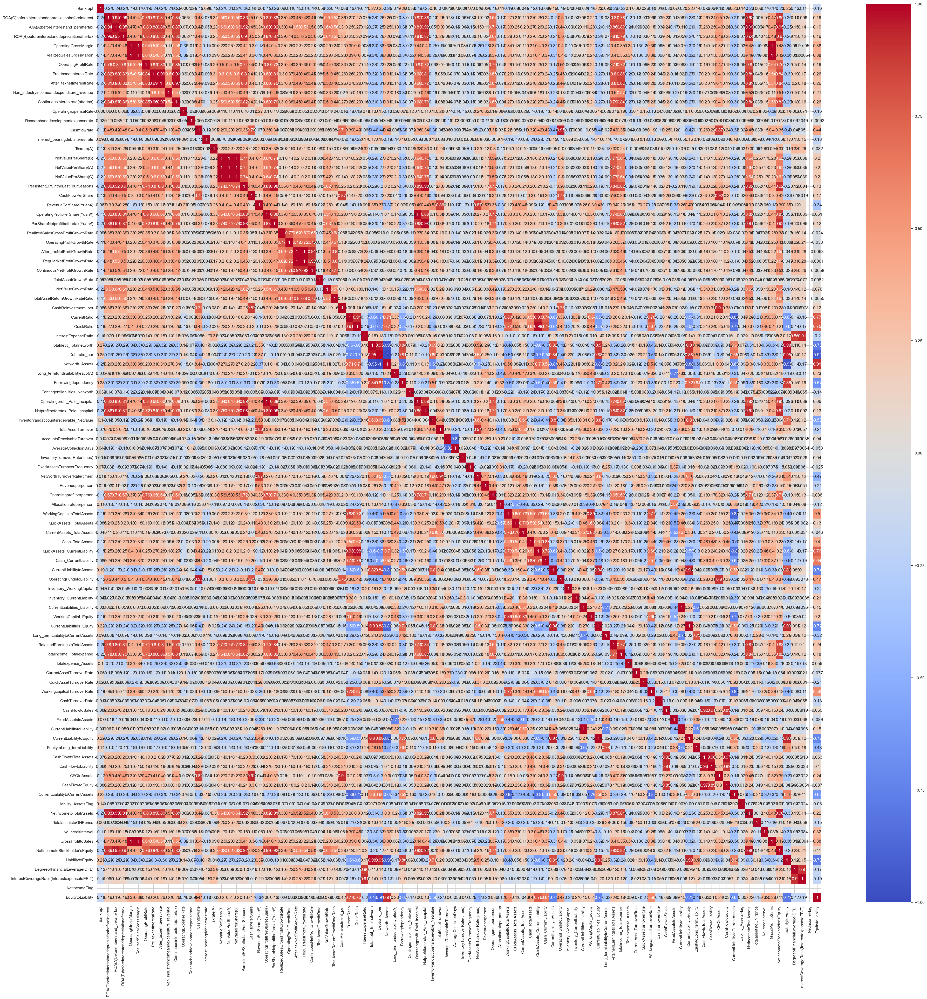

In [31]:

plt.figure(figsize=(45,45))
corr_matrix= df.corr() # calculate the correlation coeficient
sns.heatmap(corr_matrix,cmap="coolwarm",annot=True)


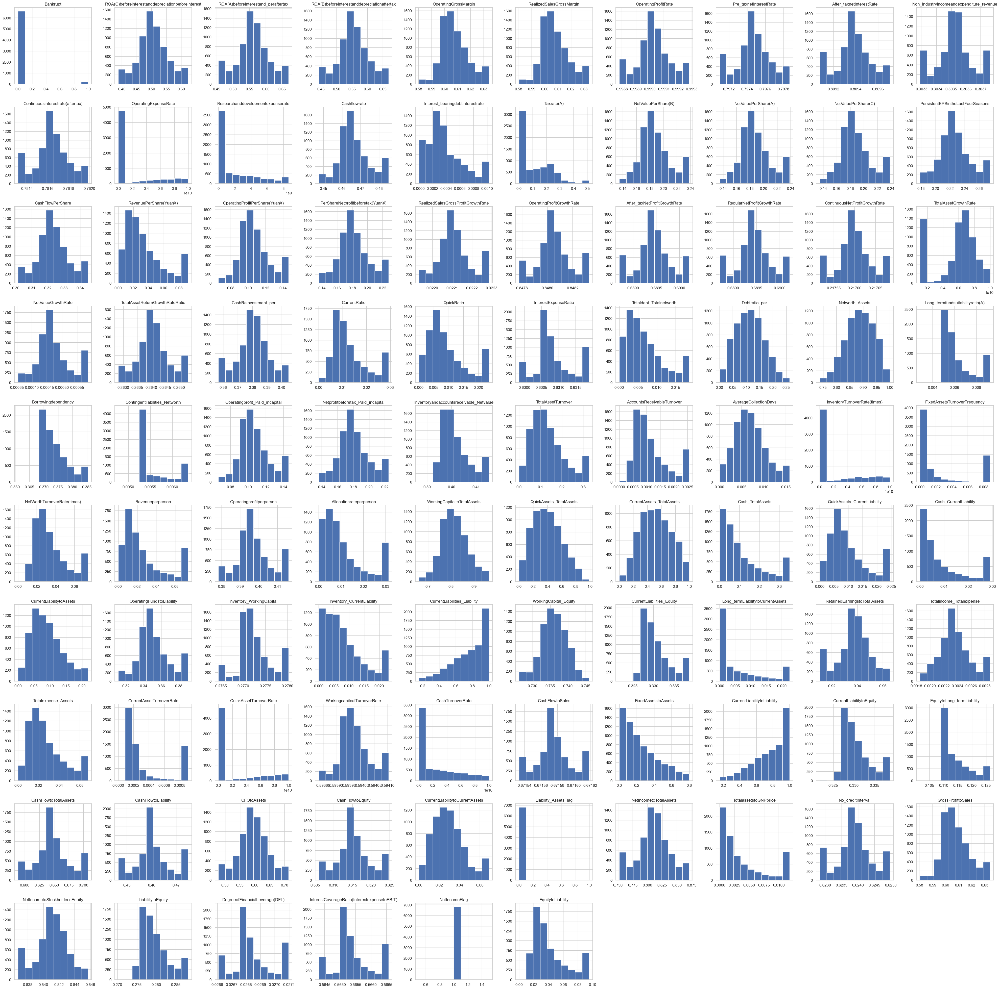

In [32]:
df.hist(figsize=(50, 50))
plt.show()

# -----Tasks : 3

# -------Hypothesis Testing:---------

# -Perform hypothesis testing to identify significant features influencing bankruptcy.-

In [33]:
pre_correlations.head()

Bankrupt                           1.000000
Debtratio_per                      0.250161
CurrentLiabilitytoAssets           0.194494
Borrowingdependency                0.176543
CurrentLiabilitytoCurrentAssets    0.171306
Name: Bankrupt, dtype: float64

# One way Anova

In [34]:
df1 = df[['Bankrupt','LiabilitytoEquity']]
df1.head()

,Bankrupt,LiabilitytoEquity
0,1,0.288207
1,1,0.283846
2,1,0.288207
3,1,0.281721
4,1,0.278514


In [35]:
mod1 = ols('LiabilitytoEquity ~ Bankrupt', data=df1).fit() # here we are checking that LiabilitytoEquity is depend on Bankrupt

In [36]:
table = sm.stats.anova_lm(mod1)

In [37]:
print(table)  # F(439.780814) this is the singnificant value, PR(>F)(1.121240e-94) this is the p-value

              df    sum_sq   mean_sq           F        PR(>F)
Bankrupt     1.0  0.005255  0.005255  439.780814  1.121240e-94
Residual  6817.0  0.081452  0.000012         NaN           NaN


In [38]:
res = pairwise_tukeyhsd(df.LiabilitytoEquity, df.Bankrupt)

In [39]:
print(res)

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj lower  upper  reject
-------------------------------------------------
     0      1    0.005   0.0 0.0045 0.0054   True
-------------------------------------------------


In [40]:
#### Null Hypothesis mean are not equal.
## We reject null hypothesis

# -----------------------------------------------------------------------------------------------------------------

# 4. Feature Engineering and Selection:

In [41]:
pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [42]:
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

In [157]:
import numpy as np
import pandas as pd
import scipy 
from scipy import stats
from scipy.stats import norm,t


#--- HYPOTHESIS TESTING ---
import statsmodels
from statsmodels import stats
from statsmodels.stats import weightstats


#--- ANOVA ---
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.multicomp
from statsmodels.stats.multicomp import pairwise_tukeyhsd

#--- One Prortion Test ---
from statsmodels.stats import proportion

#--- MATPLOTLIB ---
import matplotlib

from matplotlib import pyplot as plt
import pylab
from pylab import plot, show, legend, title, xlabel, ylabel

#--- TRAIN ---
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

#---
import statsmodels.formula.api as smf
from statsmodels.discrete.discrete_model import Poisson as psn
from statsmodels.discrete.discrete_model import NegativeBinomial as nbm

import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler

import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE

In [147]:
# Separate the features and the target variable
X = df.drop(columns=['Bankrupt','NetIncomeFlag'])  # Features
y = df['Bankrupt']  # Target variable

# Splitting data into training (75%) and testing (25%) sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=20)

In [158]:
# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to the training data
X, y = smote.fit_resample(X, y)


In [159]:
# # Scale the data
# scaler = StandardScaler()
# x_new = scaler.fit_transform(X)
# y_new = scaler.transform(y)

# # Apply SMOTE to the training data if dealing with imbalanced classes
# sm = SMOTE(random_state=42)
# X_train_res, y_train_res = sm.fit_resample(X, y)

In [171]:
# Feature selection using RFE
num_features_to_select = 55  # Adjust this number based on your dataset size and complexity
rfe = RFE(estimator=LogisticRegression(max_iter=1000, random_state=42), n_features_to_select=num_features_to_select)
rfe.fit(X, y)

# Get selected feature indices
selected_indices = rfe.get_support(indices=True)

In [172]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=20)

In [173]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [174]:
model_selected=LogisticRegression()
model_selected.fit(X_train,y_train)

LogisticRegression()

In [175]:
# Get selected feature indices
selected_indices = rfe.get_support(indices=True)

# Make predictions on the training set
y_pred_train_selected = model_selected.predict(X_train)


Model Evaluation Metrics on Test Data with selected features:
Accuracy: 0.9724340175953079
Confusion Matrix:
 [[1658    0]
 [  47    0]]
Classification Report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.99      1658
           1       0.00      0.00      0.00        47

    accuracy                           0.97      1705
   macro avg       0.49      0.50      0.49      1705
weighted avg       0.95      0.97      0.96      1705



C:\Users\Gaurav\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Gaurav\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Gaurav\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


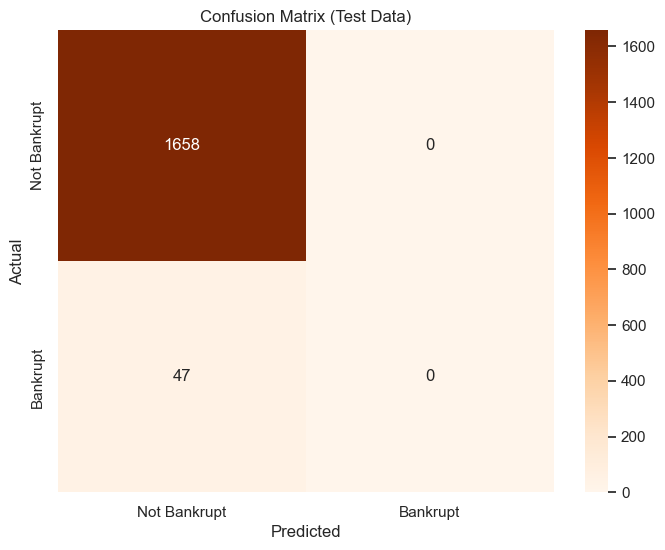

In [176]:
y_pred_test_selected = model_selected.predict(X_test)

# Evaluate the model with selected features on test data
print("\nModel Evaluation Metrics on Test Data with selected features:")
print("Accuracy:", accuracy_score(y_test, y_pred_test_selected))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_test_selected))
print("Classification Report:\n", classification_report(y_test, y_pred_test_selected))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred_test_selected)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges', xticklabels=['Not Bankrupt', 'Bankrupt'], yticklabels=['Not Bankrupt', 'Bankrupt'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Test Data)')
plt.show()

# Accuracy of the model is  0.8826979472140762


Model Evaluation Metrics on Training Data with selected features:
Accuracy: 0.9661712944857255
Confusion Matrix:
 [[4941    0]
 [ 173    0]]
Classification Report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98      4941
           1       0.00      0.00      0.00       173

    accuracy                           0.97      5114
   macro avg       0.48      0.50      0.49      5114
weighted avg       0.93      0.97      0.95      5114



C:\Users\Gaurav\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Gaurav\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Gaurav\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


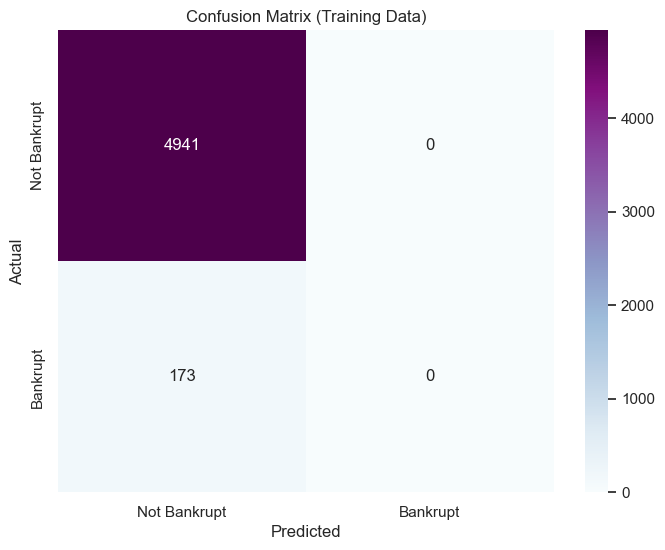

In [177]:
# Evaluate the model with selected features on training data
print("\nModel Evaluation Metrics on Training Data with selected features:")
print("Accuracy:", accuracy_score(y_train, y_pred_train_selected))
print("Confusion Matrix:\n", confusion_matrix(y_train, y_pred_train_selected))
print("Classification Report:\n", classification_report(y_train, y_pred_train_selected))

# Plot confusion matrix
cm = confusion_matrix(y_train, y_pred_train_selected)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='BuPu', xticklabels=['Not Bankrupt', 'Bankrupt'], yticklabels=['Not Bankrupt', 'Bankrupt'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Training Data)')
plt.show()

# ----Modeling:----

# Logistic Regression

In [ ]:
import statsmodels.api as sm

In [170]:
# Null Hypotysis [H0] selected_features is not influence on Bankrupt.
# Alternative Hypothesis (H1): The selected_features has a significant influence on the bankrupt.


selected_features = ['Long_termfundsuitabilityratio(A)',
       'Borrowingdependency', 'Contingentliabilities_Networth',
       'Operatingprofit_Paid_incapital', 'Netprofitbeforetax_Paid_incapital',
       'Inventoryandaccountsreceivable_Netvalue', 'TotalAssetTurnover',
       'AccountsReceivableTurnover', 'AverageCollectionDays',
       'InventoryTurnoverRate(times)', 'FixedAssetsTurnoverFrequency'
]
X = df[selected_features]
y = df['Bankrupt']



# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Add a constant to the model (for intercept)
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# Train a logistic regression model using statsmodels
logit_model = sm.Logit(y_train, X_train)
result = logit_model.fit()

# Print the summary of the model
print(result.summary())

# Make predictions on the test set
y_pred_prob = result.predict(X_test)
y_pred = (y_pred_prob > 0.5).astype(int)


conf_matrix = confusion_matrix(y_test, y_pred)

print(conf_matrix)

Optimization terminated successfully.
         Current function value: 0.089249
         Iterations 12
                           Logit Regression Results                           
Dep. Variable:               Bankrupt   No. Observations:                 5455
Model:                          Logit   Df Residuals:                     5443
Method:                           MLE   Df Model:                           11
Date:                Mon, 17 Jun 2024   Pseudo R-squ.:                  0.3539
Time:                        23:15:58   Log-Likelihood:                -486.85
converged:                       True   LL-Null:                       -753.53
Covariance Type:            nonrobust   LLR p-value:                2.456e-107
                                              coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
const                                     -65.553